In [1]:
from rmlmodels.MCLDNN_VGN import *

2024-06-14 21:59:05.430613: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-14 21:59:05.430663: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-14 21:59:05.431836: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-14 21:59:05.438967: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-14 21:59:08.021122: W tensorflow/compiler/tf2

In [42]:
custom_objects = {'ConvRFF_SinCos': ConvRFF_SinCos, 'abs_backend': abs_backend, 'expand_dim_backend': expand_dim_backend,  'pad_backend': pad_backend}
model =  tf.keras.models.load_model('weights/weights.keras',safe_mode=False, custom_objects=custom_objects)

In [3]:
y_test = np.load("Y_test.npy",allow_pickle=True)
X_test = np.load("X_test.npy",allow_pickle=True)
lbl = np.load("lbl.npy",allow_pickle=True)
test_idx = np.load("test_idx.npy",allow_pickle=True)
snrs = np.load("snrs.npy",allow_pickle=True)
mods = np.load("mods.npy",allow_pickle=True)

In [4]:
pip install git+https://github.com/UN-GCPDS/tf-keras-vis.git


  Cloning https://github.com/UN-GCPDS/tf-keras-vis.git to /tmp/pip-req-build-87m2qr1w
  Running command git clone --filter=blob:none --quiet https://github.com/UN-GCPDS/tf-keras-vis.git /tmp/pip-req-build-87m2qr1w
  Resolved https://github.com/UN-GCPDS/tf-keras-vis.git to commit 287ad22ee18bef937caee8ad9f793318c96567b0
  Preparing metadata (setup.py) ... done
  Using cached scipy-1.13.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached Deprecated-1.2.14-py2.py3-none-any.whl.metadata (5.4 kB)
  Using cached imageio-2.34.1-py3-none-any.whl.metadata (4.9 kB)
Using cached Deprecated-1.2.14-py2.py3-none-any.whl (9.6 kB)
Using cached imageio-2.34.1-py3-none-any.whl (313 kB)
Using cached scipy-1.13.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (38.6 MB)
  Created wheel for tf-keras-vis: filename=tf_keras_vis-0.8.1-py3-none-any.whl size=53440 sha256=619ae2c37d8a0c9263671347e96402f0026fd221d934cc309a09f317a713c7c0
  Stored in directory: /t

In [5]:
pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Note: you may need to restart the kernel to use updated packages.


In [6]:
from tensorflow.keras.utils import plot_model


# Assuming 'model' is your Keras model
plot_model(model, to_file='model_plot.pdf', show_shapes=True, show_layer_names=True)


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [7]:
X_test.shape

(44000, 2, 128, 1)

In [8]:
snrs

array([-20, -18, -16, -14, -12, -10,  -8,  -6,  -4,  -2,   0,   2,   4,
         6,   8,  10,  12,  14,  16,  18])

/tmp/ipykernel_178/2618338980.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_178/2618338980.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_178/2618338980.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_178/2618338980.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_178/2618338980.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_178/2618338980.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorr

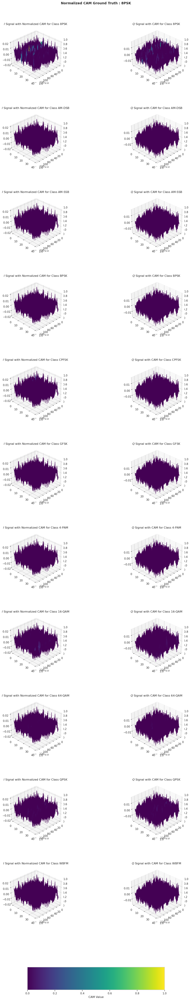

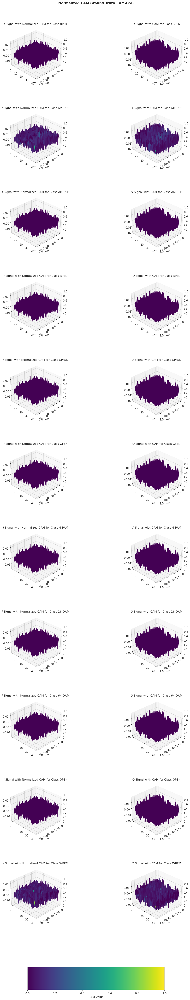

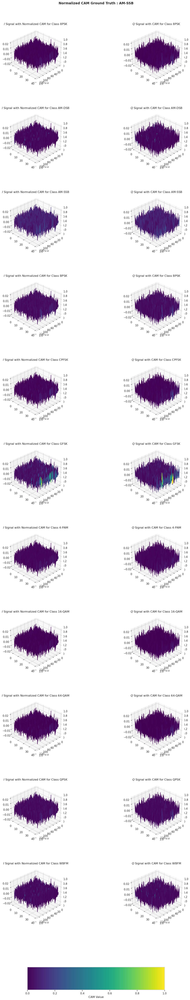

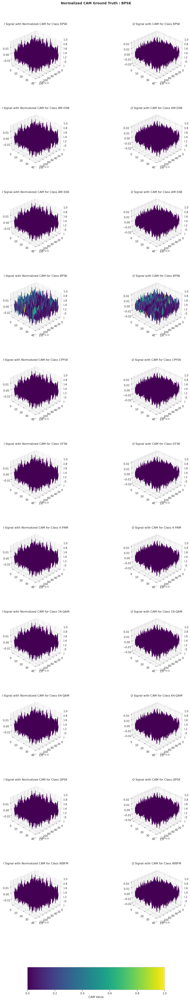

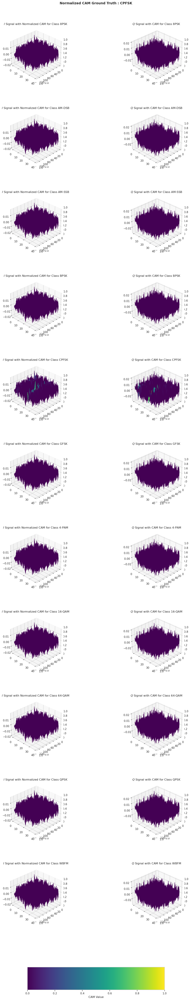

...

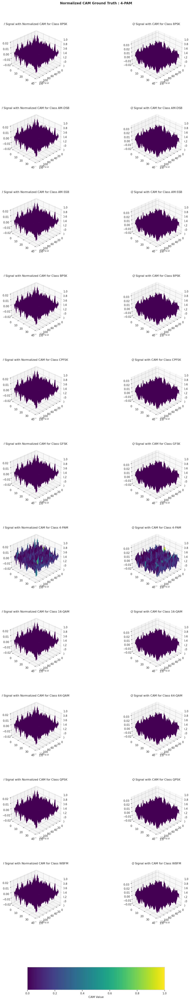

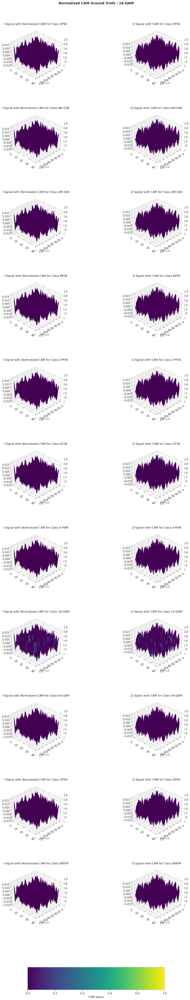

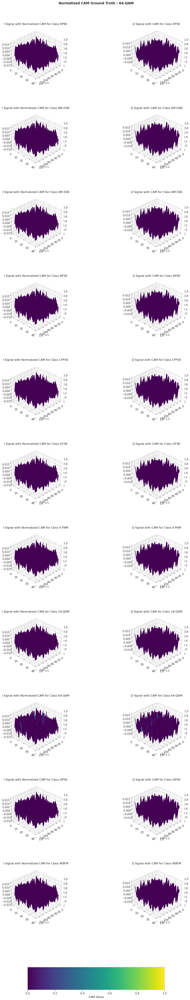

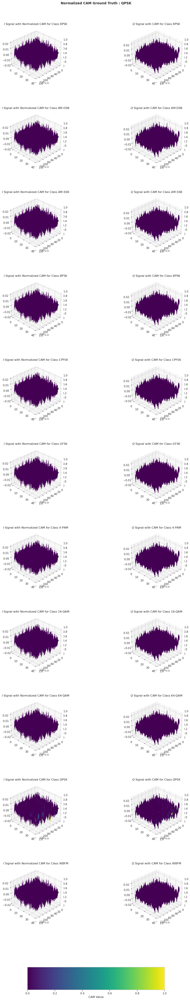

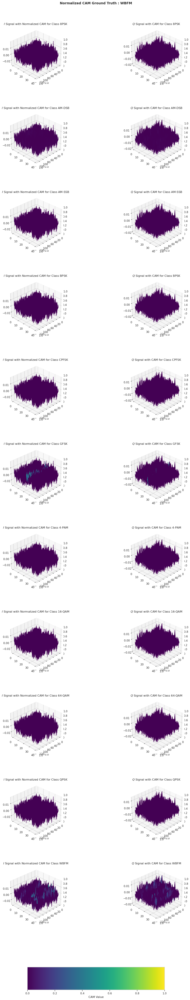

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
import seaborn as sns
import os


output_directory = "CAMSResult"
sns.set_context("notebook")
sns.set_style("whitegrid")
plt.rcParams['text.usetex'] = False
class_names = ['8PSK','AM-DSB','AM-SSB','BPSK','CPFSK','GFSK','4-PAM','16-QAM','64-QAM','QPSK','WBFM']
# Extract classes @ SNR
test_SNRs = [lbl[x][1] for x in test_idx]

test_Y_i = y_test[np.where(np.array(test_SNRs) == "-2")]

test_X_i=X_test[np.where(np.array(test_SNRs) == "-2")]

for modulation in range(11):
    replace2linear = ReplaceToLinear()
    
    # Sample data
    num_classes = 11
    indices = np.where(test_Y_i[:, modulation] == 1)[0]
    sample = test_X_i[indices]
    random_indices = np.random.choice(samples.shape[0], 40, replace=False)
    sample_expanded = sample[random_indices]
    
    # Initialize a figure to plot the signals and CAMs
    f, axarr = plt.subplots(num_classes, 2, figsize=(16, 6*num_classes), subplot_kw={"projection" : "3d"})
    name = class_names[modulation]
    f.suptitle(f"Normalized CAM Ground Truth : {name}", fontsize=14, y=1.01, weight='bold')
    
    gradcam = GradcamPlusPlus(model, model_modifier=replace2linear, clone=True)
    
    # Collect CAM values for all classes to find global vmin and vmax
    all_cams = []
    for class_idx in range(num_classes):
        def class_loss(output):
            return output[:, class_idx]
        cam = gradcam(class_loss, sample_expanded, penultimate_layer="conv2d_3", seek_penultimate_conv_layer=False, normalize_cam=False)
        all_cams.append(cam)
    vmin = min(cam.min() for cam in all_cams)
    vmax = max(cam.max() for cam in all_cams)
    norm = Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap('viridis')
    
    # Plotting
    for class_idx in range(num_classes):
        cam = all_cams[class_idx]
        
        # Plot I signal with CAM colors
        axarr[class_idx, 0] = f.add_subplot(num_classes, 2, class_idx*2+1, projection='3d')
        X = np.arange(0, sample_expanded.shape[2])
        Y = np.arange(0, sample_expanded.shape[0])
        X, Y = np.meshgrid(X, Y)
        Z = sample_expanded[:, 0, :, 0]
        surf = axarr[class_idx, 0].plot_surface(X, Y, Z, facecolors=cmap(norm(cam[:, 0, :])), cmap=cmap, linewidth=1, antialiased=True, alpha=0.99)
        axarr[class_idx, 0].set_title(r'$I$ Signal with Normalized CAM for Class {}'.format(class_names[class_idx]))
        axarr[class_idx, 0].view_init(elev=30, azim=45)  # Adjust perspective
 
        
        # Plot Q signal with CAM colors
        axarr[class_idx, 1] = f.add_subplot(num_classes, 2, class_idx*2+2, projection='3d')
        Z = sample_expanded[:, 1, :, 0]
        surf = axarr[class_idx, 1].plot_surface(X, Y, Z, facecolors=cmap(norm(cam[:, 1, :])), cmap=cmap, linewidth=1, antialiased=True, alpha=0.99)
        axarr[class_idx, 1].set_title(r'$Q$ Signal with CAM for Class {}'.format(class_names[class_idx]))
        axarr[class_idx, 1].view_init(elev=30, azim=45)  # Adjust perspective
        
    
    # Add horizontal colormap (colorbar) to the figure under all subplots
    cax = f.add_axes([0.25, 0.14, 0.5, 0.02])
    norm = Normalize(vmin=0, vmax=1)
    cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cax, orientation='horizontal')
    cb.set_label(r'CAM Value')
    
    output_file = os.path.join(output_directory, f'CAM_Normalized_for_Class_{name}:-2Snr.pdf')
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.2, hspace=0.5)
    plt.savefig(output_file, bbox_inches='tight')
    

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.interpolate import griddata
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
import seaborn as sns
import os

output_directory = "CAMSResult"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
sns.set_context("notebook")
sns.set_style("whitegrid")
plt.rcParams['text.usetex'] = False
class_names = ['8PSK', 'AM-DSB', 'AM-SSB', 'BPSK', 'CPFSK', 'GFSK', '4-PAM', '16-QAM', '64-QAM', 'QPSK', 'WBFM']

replace2linear = ReplaceToLinear()
gradcam = GradcamPlusPlus(model, model_modifier=replace2linear, clone=True)


for modulation in range(0,11):
    indices = np.where(test_Y_i[:, modulation] == 1)[0]
    samples = test_X_i[indices]
    random_indices = np.random.choice(samples.shape[0], 2, replace=False)

    samples_expanded = samples[random_indices]  # Select the first 50 samples for each modulation

    # Initialize CAMs array
    CAM_values = []

    for sample in samples_expanded:
        cam = gradcam(lambda output: output[:, modulation], sample, penultimate_layer="conv2d_4", normalize_cam=False, seek_penultimate_conv_layer=False)
        cam_flat = cam.flatten()[:np.prod(sample.shape[1:])]  # Flatten and trim CAM to match I and Q size
        CAM_values.append(cam_flat)

    CAM_values = np.concatenate(CAM_values)

    # Concatenating signal data
    I_concatenated = np.concatenate([s[0, :, :].flatten() for s in samples_expanded], axis=0)
    Q_concatenated = np.concatenate([s[1, :, :].flatten() for s in samples_expanded], axis=0)

    # Normalize CAM data for coloring
    norm = Normalize(vmin=CAM_values.min(), vmax=CAM_values.max())
    cmap = plt.get_cmap('viridis')

    # Plotting
    plt.figure(figsize=(15, 7))
    sc = plt.scatter(I_concatenated, Q_concatenated, c=CAM_values, cmap=cmap, norm=norm, alpha=0.4)
    plt.colorbar(sc, label='Normalized CAM Intensity')
    plt.title(f'Scatter Plot of I and Q Signals with CAM for {class_names[modulation]} Modulation')
    plt.xlabel('I Signal')
    plt.ylabel('Q Signal')
    plt.grid(True)
    plt.show()

    output_file = os.path.join(output_directory, f'CAM_Scatter_{class_names[modulation]}.pdf')
    plt.savefig(output_file, bbox_inches='tight')

ValueError: Unable to determine penultimate `Conv` layer. `penultimate_layer`=conv2d_4

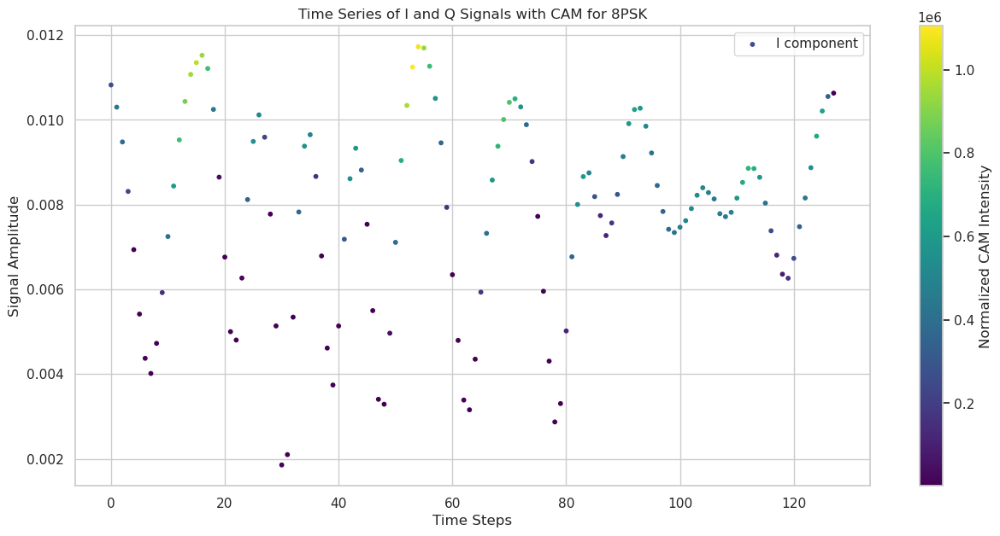

<Figure size 640x480 with 0 Axes>

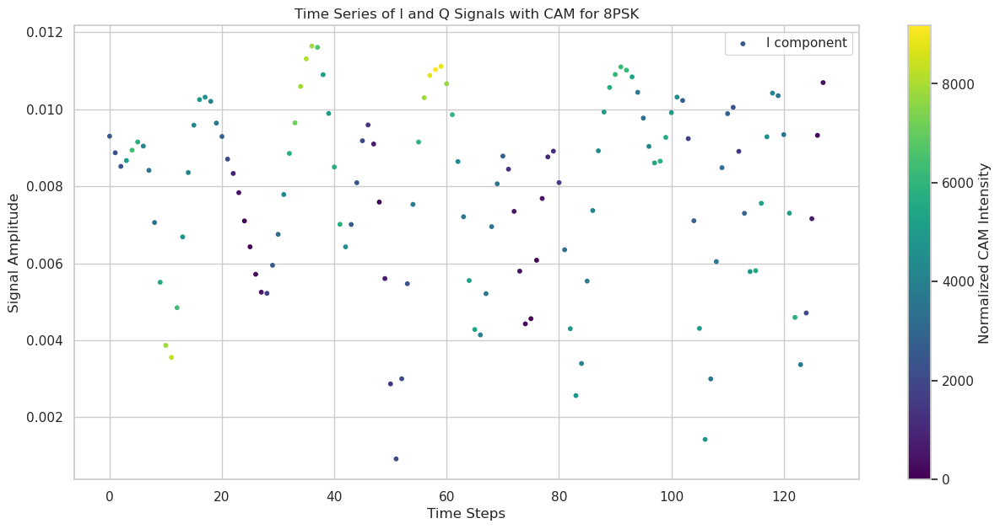

<Figure size 640x480 with 0 Axes>

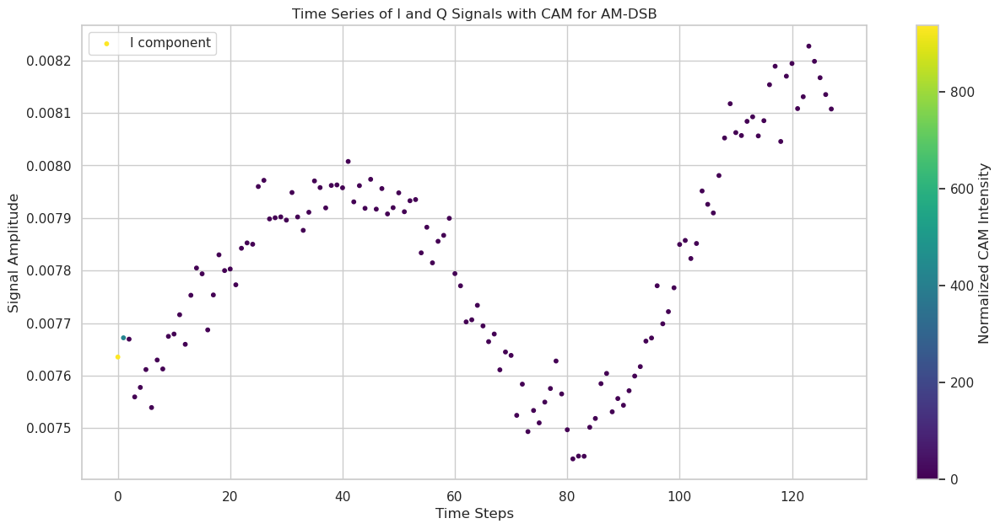

<Figure size 640x480 with 0 Axes>

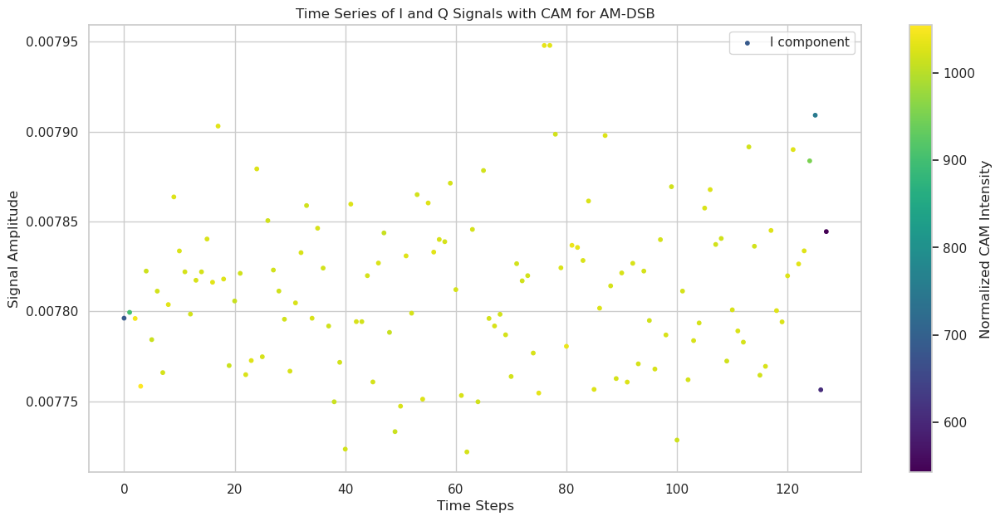

<Figure size 640x480 with 0 Axes>

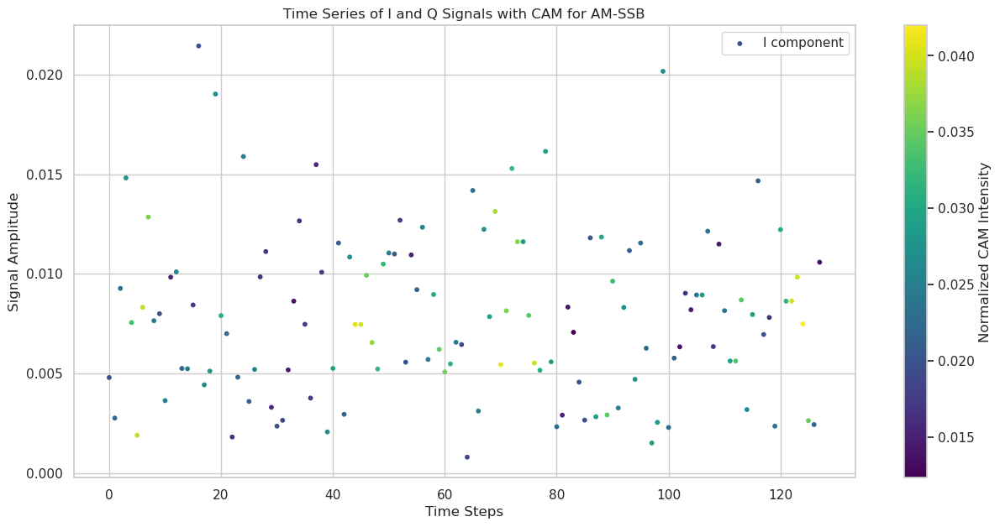

<Figure size 640x480 with 0 Axes>

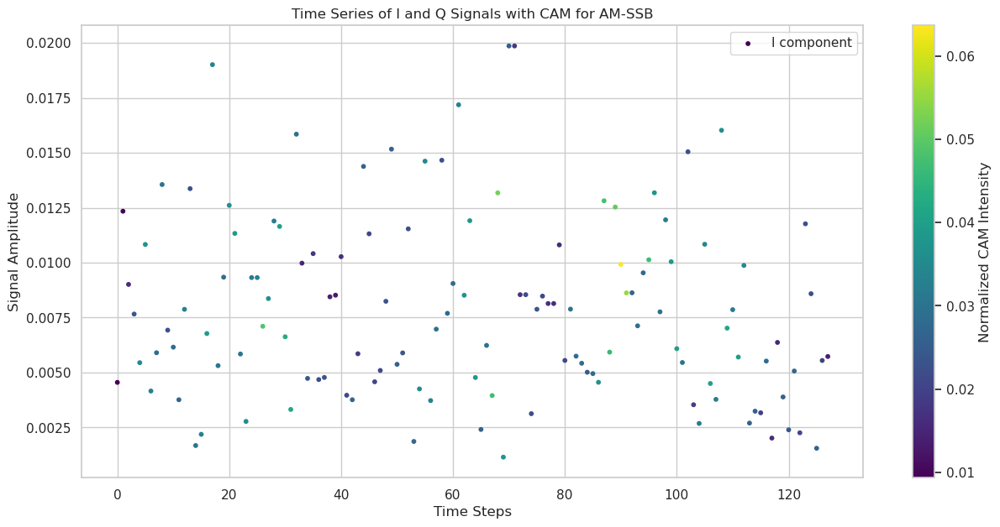

<Figure size 640x480 with 0 Axes>

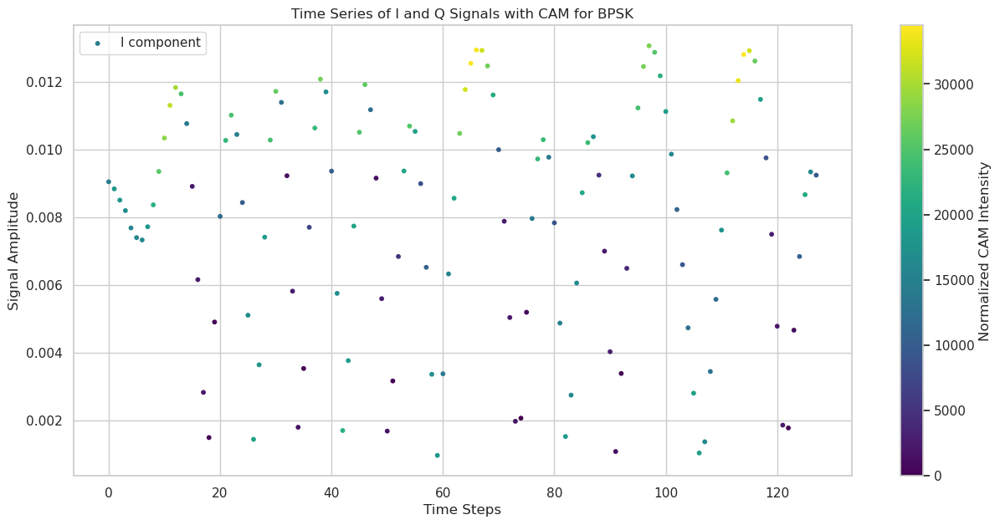

<Figure size 640x480 with 0 Axes>

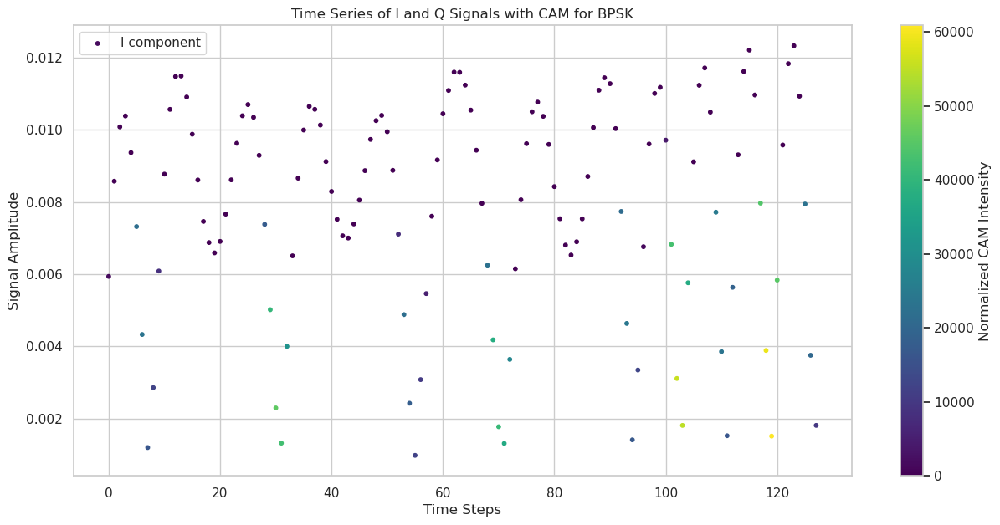

<Figure size 640x480 with 0 Axes>

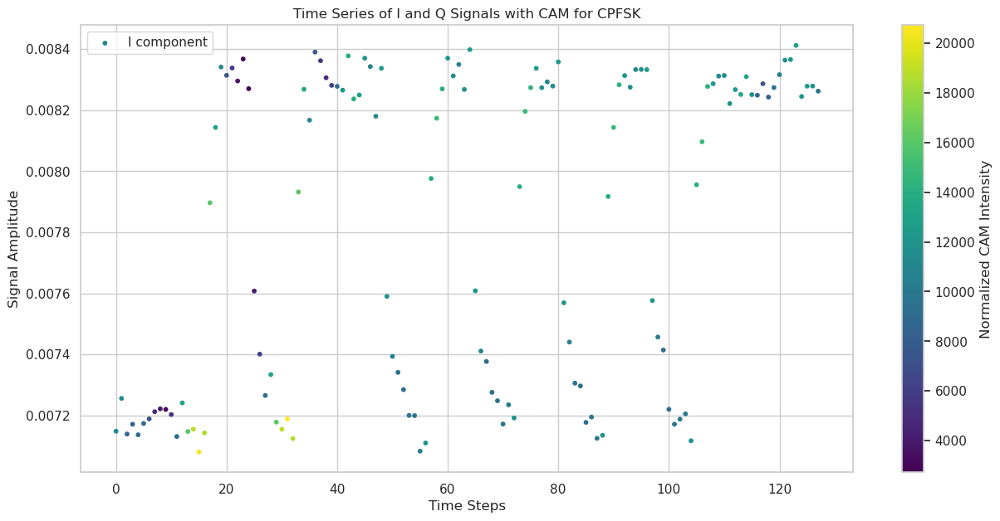

<Figure size 640x480 with 0 Axes>

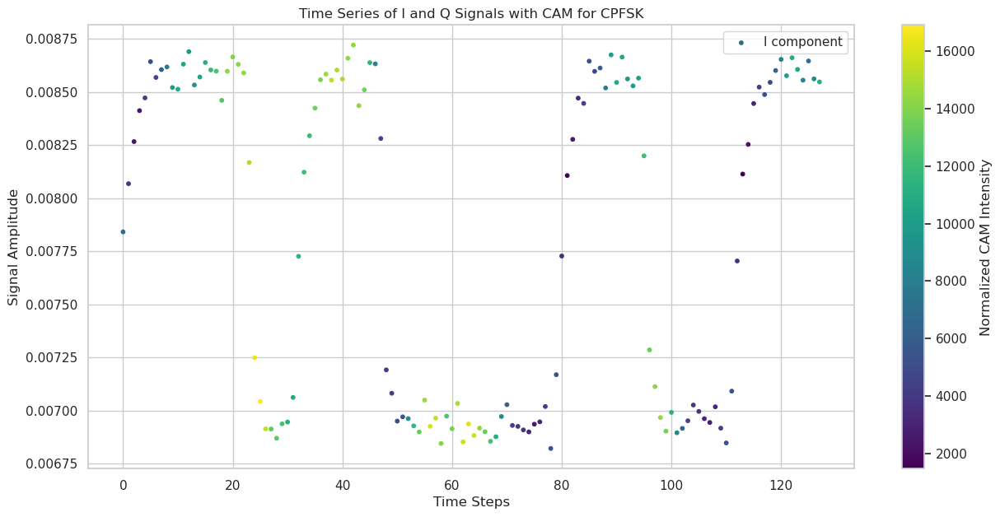

<Figure size 640x480 with 0 Axes>

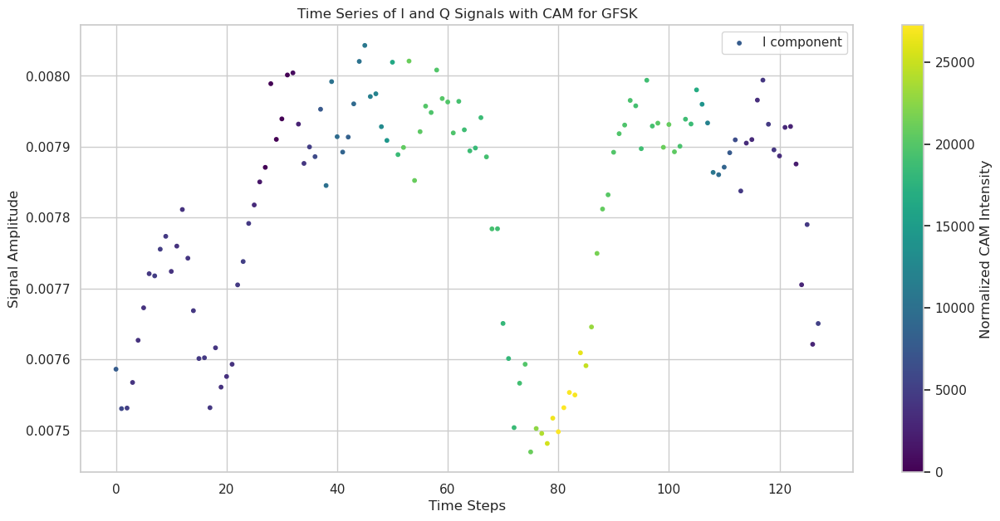

<Figure size 640x480 with 0 Axes>

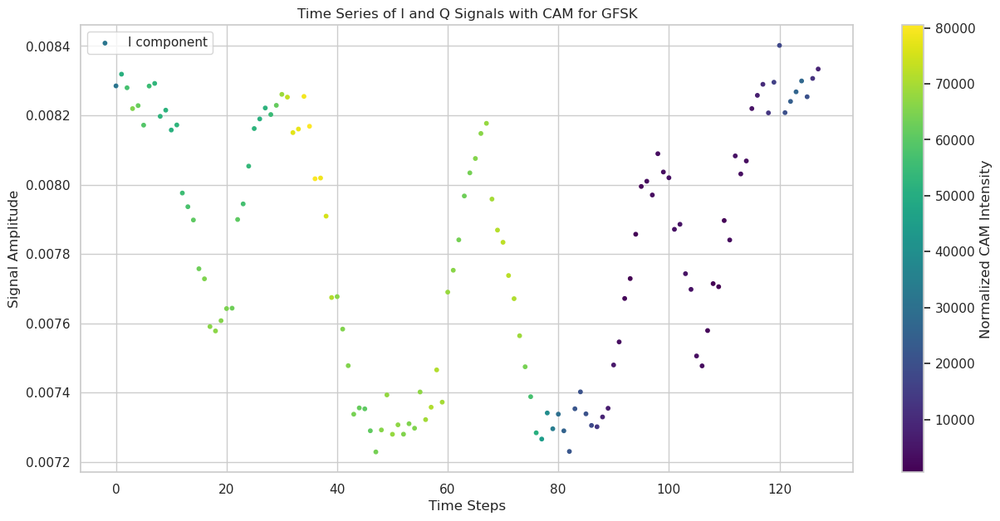

<Figure size 640x480 with 0 Axes>

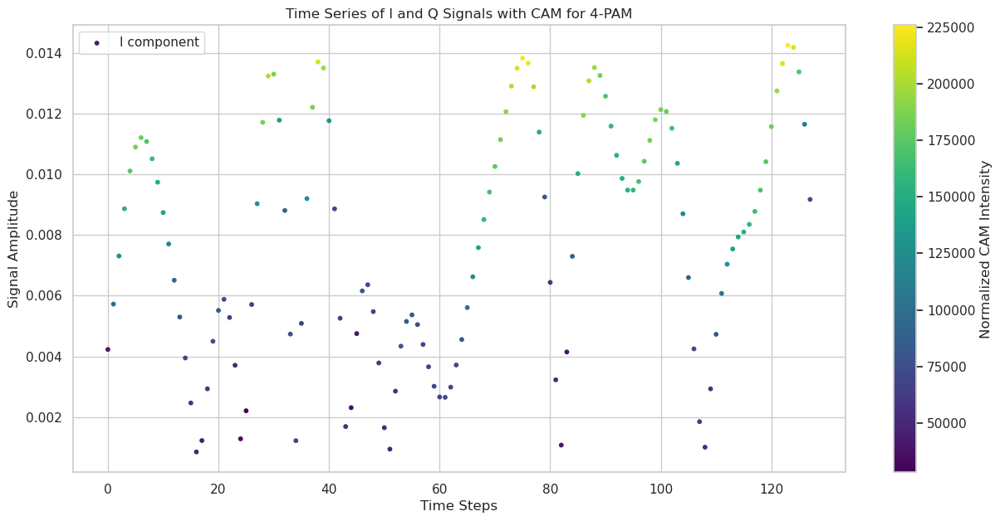

<Figure size 640x480 with 0 Axes>

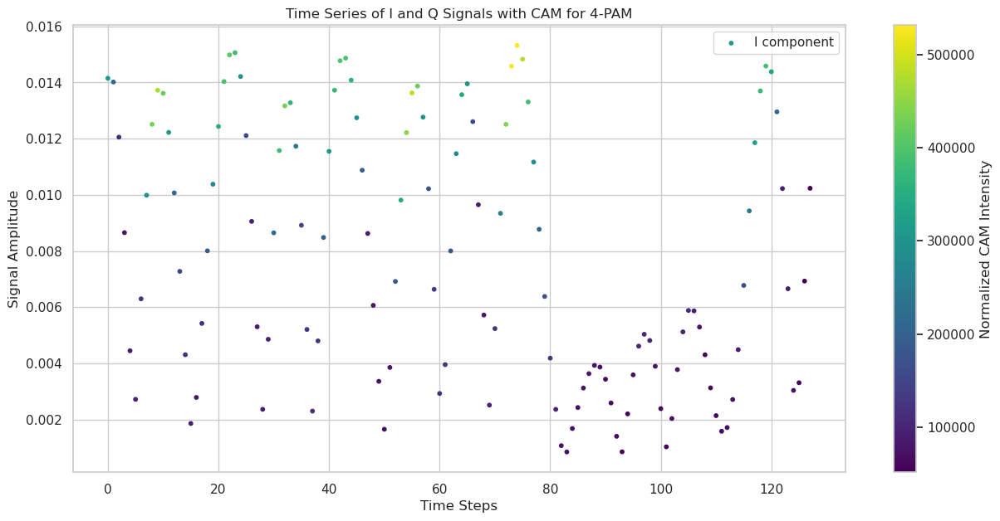

<Figure size 640x480 with 0 Axes>

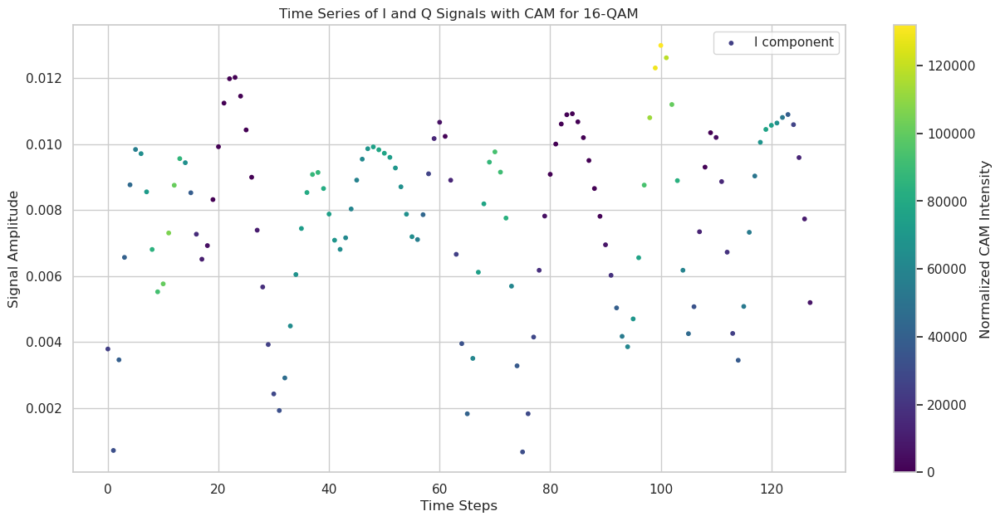

<Figure size 640x480 with 0 Axes>

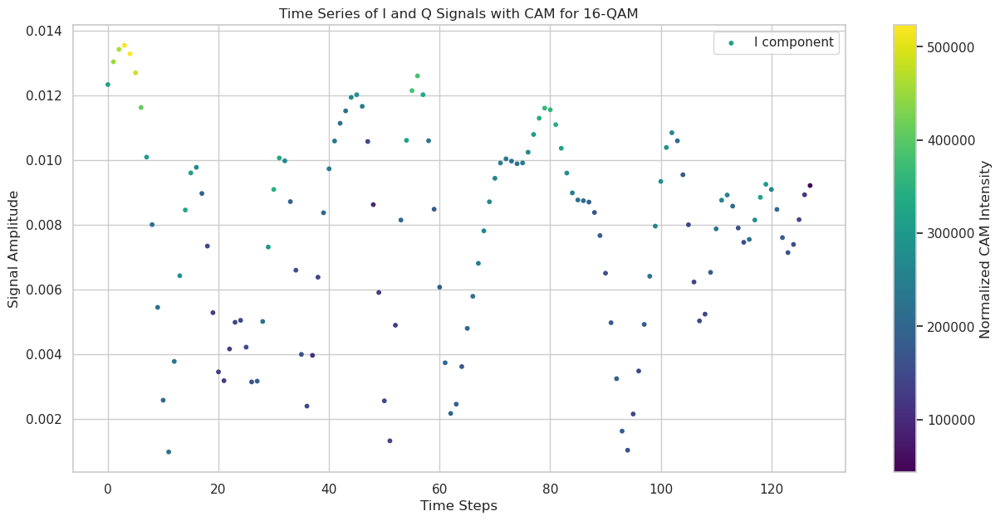

<Figure size 640x480 with 0 Axes>

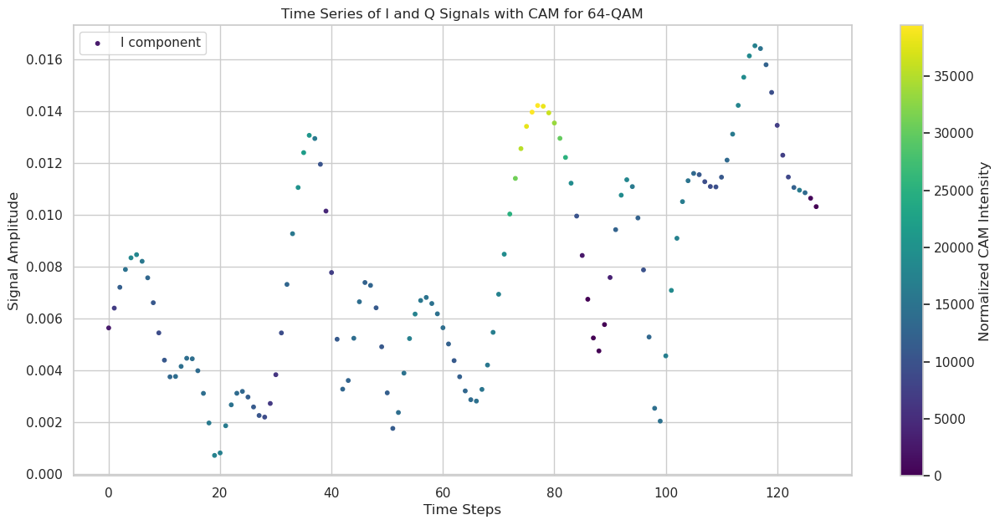

<Figure size 640x480 with 0 Axes>

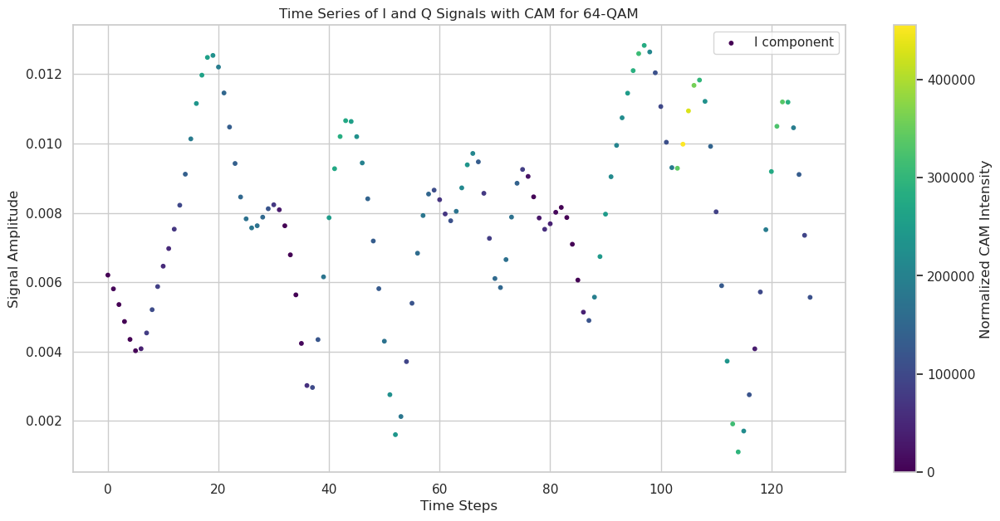

<Figure size 640x480 with 0 Axes>

Exception ignored in: <function WeakKeyDictionary.__init__.<locals>.remove at 0x7f9138b67490>
Traceback (most recent call last):
  File "/opt/saturncloud/envs/saturn/lib/python3.10/weakref.py", line 370, in remove
    def remove(k, selfref=ref(self)):
KeyboardInterrupt: 


KeyboardInterrupt: 

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
import seaborn as sns
import os

output_directory = "CAMSResult"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
sns.set_context("notebook")
sns.set_style("whitegrid")
plt.rcParams['text.usetex'] = False
class_names = ['8PSK', 'AM-DSB', 'AM-SSB', 'BPSK', 'CPFSK', 'GFSK', '4-PAM', '16-QAM', '64-QAM', 'QPSK', 'WBFM']

replace2linear = ReplaceToLinear()
gradcam = GradcamPlusPlus(model, model_modifier=replace2linear, clone=True)

for modulation in range(0, 11):
    indices = np.where(test_Y_i[:, modulation] == 1)[0]
    samples = test_X_i[indices]
    random_indices = np.random.choice(samples.shape[0], 2, replace=False)

    samples_expanded = samples[random_indices]

    for sample in samples_expanded:
        cam = gradcam(lambda output: output[:, modulation], sample[np.newaxis, ...], penultimate_layer="conv2d_2", normalize_cam=False, seek_penultimate_conv_layer=False)
        cam_flat = cam.flatten()[:np.prod(sample.shape[1:])]

        # Prepare I and Q signals
        I_signal = sample[0, :, :].flatten()
        Q_signal = sample[1, :, :].flatten()
        time_steps = np.arange(I_signal.size)

        # Normalize CAM data for coloring
        norm = Normalize(vmin=cam_flat.min(), vmax=cam_flat.max())
        cmap = plt.get_cmap('viridis')

        # Plotting
        plt.figure(figsize=(15, 7))
        plt.scatter(time_steps, np.sqrt(I_signal**2 + Q_signal**2), c=cam_flat, cmap=cmap, norm=norm, s=10, label='I component')
        
        plt.colorbar(label='Normalized CAM Intensity')
        plt.title(f'Time Series of I and Q Signals with CAM for {class_names[modulation]}')
        plt.xlabel('Time Steps')
        plt.ylabel('Signal Amplitude')
        plt.legend()
        plt.grid(True)
        plt.show()

        output_file = os.path.join(output_directory, f'Time_Series_CAM_{class_names[modulation]}.pdf')
        plt.savefig(output_file, bbox_inches='tight')
